In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import seaborn as sns
sns.set_context("paper")
sns.set_style("ticks")

Consider the model:

$$
dS_t = \mu S_t dt + \sqrt{v_t} S_t dW_{1,t},
$$

where $W_{1,t}$ is a Brownian motion $\mu$ is a constant drift, and $v_t$ is a stochastic volatility process given by the Heston model:

$$
dv_t = \theta (\omega - v_t) dt + \xi \sqrt{v_t} dW_{2,t},
$$

where $W_{2,t}$ is another motion, $\theta$ is the speed of mean reversion, $\omega$ is the long-term average volatility, and $\xi$ is the volatility of volatility.

The observations are going to be:

$$
y_t = S_t + s \epsilon_t,
$$

where $s$ is the standard deviation of the observation noise, and $\epsilon_t$ is a standard normal random variable.

In [3]:
import jax.random as jr
import jax.numpy as jnp
from diffrax import diffeqsolve, ControlTerm, Euler, MultiTerm, ODETerm, SaveAt, VirtualBrownianTree

t0, t1 = 0, 20
mu = 0.2
theta = 0.5
omega = 0.4
sigma = 0.01
xi = 0.2
s = 0.05
dt = 0.001

key = jr.PRNGKey(0)
key, subkey = jr.split(key)
drift = lambda t, y, args: jnp.array([mu * y[0], theta * (omega - y[1])])
diffusion = lambda t, y, args: jnp.array([[jnp.sqrt(y[1]) * y[0], 0.], [0., xi * jnp.sqrt(y[1])]])
brownian_motion = VirtualBrownianTree(t0, t1, tol=1e-3, shape=(2,), key=subkey)
terms = MultiTerm(ODETerm(drift), ControlTerm(diffusion, brownian_motion))
solver = Euler()
ts = jnp.linspace(t0, t1, int((t1 - t0) / dt) + 1)
saveat = SaveAt(ts=ts)

# Sample a path from the SDE
sol = diffeqsolve(terms, solver, t0, t1, dt0=0.05, y0=jnp.array([1.0, 0.1]), saveat=saveat)
xs = sol.ys

# Generate the observations
key, subkey = jr.split(key)
ys = xs[:, 0] + s * jr.normal(subkey, shape=xs.shape[0])

In [4]:
fig, ax = plt.subplots()
ax.plot(ts, xs[:, 0], label='$S_t$')
ax.plot(ts, xs[:, 1], label='$V_t$')
ax.plot(ts, ys, 'k.', label='$Y_t$', alpha=0.5)
ax.legend(frameon=False)
ax.set_xlabel('Time')
ax.set_ylabel('Value')
sns.despine(trim=True)


We will apply article filters to find $(S_t, v_t)$ from the observations $y_t$.
The first step is to discretize the model and turn it into a state-space model.
We use the Euler-Maruyama method:

$$
S_{t+\Delta t} = S_t + \mu S_t \Delta t + \sqrt{v_t} S_t \sqrt{\Delta t} Z_{1,t},
$$

$$
v_{t+\Delta t} = v_t + \theta (\omega - v_t) \Delta t + \xi \sqrt{v_t} \sqrt{\Delta t} Z_{2,t},
$$

where $Z_{1,t}$ and $Z_{2,t}$ are independent standard normal random variables.

Now, think of the time in terms of increments of $\Delta t$.
Set:

$$
x_t = \begin{bmatrix} S_{t\Delta t} \\ v_{t\Delta t} \end{bmatrix}.
$$

We need a probability for the initial conditions.
Let's pick a Lognormal:

$$
p(x_0) = p(S_0)p(v_0),
$$

with:

$$
p(S_0) = \text{Lognormal} \left( S_0\middle| \mu_S, \sigma_S^2 \right),
$$

$$
p(v_0) = \text{Lognormal} \left( v_0\middle| \mu_v, \sigma_v^2 \right).
$$

We also need the transition probability density function:

$$
p(x_{t+1} | x_t) = \mathcal{N} \left( x_t\middle|\begin{bmatrix} S_{t\Delta t} + \mu S_{t\Delta t} \Delta t \\ v_{t\Delta t} + \theta (\omega - v_{t\Delta t}) \Delta t \end{bmatrix}, \begin{bmatrix} v_{t\Delta t} S_{t\Delta t}^2 \Delta t & 0 \\ 0 & \xi^2 v_{t\Delta t} \Delta t \end{bmatrix} \right),
$$

and the observation probability density function:

$$
p(y_t | x_t) = \mathcal{N} \left(y_t\middle| S_{t\Delta t}, s^2 \right).
$$

Let's code these up.
We need to be able to sample from the transition density, and we need to be able to evaluate both of them.

In [5]:
import jax
from jax import vmap, jit
from functools import partial
import equinox as eqx

class VolatilityModel(eqx.Module):
    theta: jax.Array

    def __init__(self, mu=mu, theta=theta, omega=omega, xi=xi, s=s, 
                 mu_S=0.0,
                 sigma_S=2.0,
                 mu_V=jnp.log(0.1),
                 sigma_V=0.2,
                 dt=dt):
        self.theta = jnp.array(
            [mu, theta, omega, xi, s, mu_S, sigma_S, mu_V, sigma_V]
        )
        self.mu = mu
        self.theta = theta
        self.omega = omega
        self.xi = xi
        self.s = s
        self.mu_S = mu_S
        self.sigma_S = sigma_S
        self.mu_V = mu_V
        self.sigma_V = sigma_V

    def drift(self, x):
        return jnp.array([self.mu * x[0], self.theta * (self.omega - x[1])])

    def diffusion(self, x):
        return jnp.array([jnp.sqrt(x[1]) * x[0], self.xi * jnp.sqrt(x[1])])
    
    @partial(jit, static_argnums=(0,))
    @partial(vmap, in_axes=(None, 0))
    def sample_init(self, key):
        key1, key2 = jr.split(key)
        S0 = jnp.exp(jr.normal(key1) * self.sigma_S + self.mu_S)
        V0 = jnp.exp(jr.normal(key2) * self.sigma_V + self.mu_V)
        return jnp.array([S0, V0])
    
    def log_prob_init(self, x):
        S0 = x[0]
        V0 = x[1]
        log_prob_s = -0.5 * ((jnp.log(S0) - self.mu_S) / self.sigma_S) ** 2 - jnp.log(self.sigma_S)
        log_prob_v = -0.5 * ((jnp.log(V0) - self.mu_V) / self.sigma_V) ** 2 - jnp.log(self.sigma_V)
        return log_prob_s + log_prob_v
    
    def log_prob_transition(self, x_next, x_prev):
        drift = self.drift(x_prev)
        diffusion = self.diffusion(x_prev)
        mean = x_prev + drift * self.dt
        L = jnp.sqrt(self.dt) * diffusion
        return -0.5 * jnp.sum(((x_next - mean) / L) ** 2) - jnp.sum(jnp.log(L))
    
    @partial(jit, static_argnums=(0,))
    @partial(vmap, in_axes=(None, 0, 0))
    def transition(self, x_prev, key):
        drift = self.drift(x_prev)
        diffusion = self.diffusion(x_prev)
        return x_prev + drift * self.dt + jnp.sqrt(self.dt) * diffusion * jr.normal(key, shape=x_prev.shape)

    @partial(jit, static_argnums=(0,))
    @partial(vmap, in_axes=(None, None, 0))
    def log_prob_observation(self, y, x):
        return -0.5 * ((y - x[0]) / self.s) ** 2 - jnp.log(self.s)

Now we are ready to implement the bootstrap filter.

In [6]:
model = VolatilityModel()

AttributeError: Cannot set attribute mu

In [ ]:
import jax

@partial(jit, static_argnums=(2,3))
def particle_filter(key, ys, model, num_particles=1000):
    def f(carry, y):
        x_prev, log_w_prev, key = carry
        w_prev = jnp.exp(log_w_prev)
        key, subkey = jr.split(key)
        tilde_x_prev = jr.choice(subkey, x_prev, shape=(x_prev.shape[0],), p=w_prev)
        key, subkey = jr.split(key)
        keys = jr.split(subkey, x_prev.shape[0])
        x_next = model.transition(tilde_x_prev, keys)
        log_w_next = model.log_prob_observation(y, x_next)
        log_w_next = log_w_next - jax.scipy.special.logsumexp(log_w_next)
        return (x_next, log_w_next, key), (x_next, log_w_next)

    key, subkey = jr.split(key)
    keys = jr.split(subkey, num_particles)
    x0 = model.sample_init(keys)
    log_w0 = -jnp.log(num_particles) * jnp.ones(num_particles)
    init = (x0, log_w0, key)
    _, (xs, log_ws) = jax.lax.scan(f, init, ys)
    return xs, log_ws

In [ ]:
particles, log_weights = particle_filter(key, ys, model, num_particles=10000)

In [ ]:
weights = jnp.exp(log_weights)
mean = jnp.sum(particles * weights[:, :, None], axis=1)

fig, ax = plt.subplots()
ax.plot(ts, xs[:, 0], label='$S_t$')
ax.plot(ts, xs[:, 1], label='$V_t$')
ax.plot(ts, ys, 'k.', label='$Y_t$', alpha=0.5)
ax.plot(ts, mean[:, 0], label='Filter mean $S_t$', linestyle='--')
ax.plot(ts, mean[:, 1], label='Filter mean $V_t$', linestyle='--')
ax.legend(frameon=False)
ax.set_xlabel('Time')
ax.set_ylabel('Value')
sns.despine(trim=True)

In [ ]:
# visualize the filter with uncertainty
weights = jnp.exp(log_weights)
mean = jnp.sum(particles * weights[:, :, None], axis=1)
var = jnp.sum(particles ** 2 * weights[:, :, None], axis=1) - mean ** 2
std = jnp.sqrt(var)

fig, ax = plt.subplots()
ax.plot(ts, xs[:, 0], label='$S_t$')
ax.plot(ts, xs[:, 1], label='$V_t$')
#ax.plot(ts, ys, 'k.', label='$Y_t$', alpha=0.5)
ax.plot(ts, mean[:, 0], label='Filter mean $S_t$', linestyle='--')
ax.fill_between(ts, mean[:, 0] - 2 * std[:, 0], mean[:, 0] + 2 * std[:, 0], alpha=0.2)
ax.plot(ts, mean[:, 1], label='Filter mean $V_t$', linestyle='--')
ax.fill_between(ts, mean[:, 1] - 2 * std[:, 1], mean[:, 1] + 2 * std[:, 1], alpha=0.2)
ax.legend(frameon=False)
ax.set_xlabel('Time')
ax.set_ylabel('Value')
sns.despine(trim=True)

## Stochastic Duffing oscillator

The stochastic Duffing oscillator is a nonlinear dynamical system that can be used to model a wide range of phenomena.
The equation of motion is:

$$
\ddot{x} + \delta \dot{x} + \alpha x + \beta x^3 = \gamma \cos(\omega t) + \sigma \xi(t),
$$

where $x$ is the position of the oscillator, $\dot{x}$ is its velocity, $\delta$ is the damping coefficient, $\alpha$ is the linear stiffness, $\beta$ is the nonlinear stiffness, $\gamma$ is the amplitude of the driving force, $\omega$ is the frequency of the driving force, $\sigma$ is the amplitude of the noise, and $\xi(t)$ is a white noise process.

First, let's express this as a first-order SDE:

$$
dX_1 = X_2 dt,
$$

$$
dX_2 = (\gamma \cos(\omega t) - \delta X_2 - \alpha X_1 - \beta X_1^3) dt + \sigma dW_t,
$$

where $X_1 = x$ and $X_2 = \dot{x}$.
Discretize in time using the Euler-Maruyama method:

$$
X_{1,t+\Delta t} = X_{1,t} + X_{2,t} \Delta t,
$$

$$
X_{2,t+\Delta t} = X_{2,t} + (\gamma \cos(\omega t) - \delta X_{2,t} - \alpha X_{1,t} - \beta X_{1,t}^3) \Delta t + \sigma \sqrt{\Delta t} Z_t,
$$

where $Z_t$ is a standard normal random variable.

Again, think of the time in terms of increments of $\Delta t$.
Set:

$$
x_t = \begin{bmatrix} X_{1,t\Delta t} \\ X_{2,t\Delta t} \end{bmatrix}.
$$

We need a probability for the initial conditions.
Let's pick a Gaussian:

$$
p(x_0) = \mathcal{N} \left( x_0\middle| \begin{bmatrix} x_0 \\ 0 \end{bmatrix}, \begin{bmatrix} \sigma_{x_0}^2 & 0 \\ 0 & \sigma_{v_0}^2 \end{bmatrix} \right).
$$

We also need the transition probability density function:

$$
p(x_{t+1} | x_t, u_t) = \mathcal{N} \left( x_t\middle| \begin{bmatrix} X_{1,t\Delta t} + X_{2,t\Delta t} \Delta t \\ X_{2,t\Delta t} + (\gamma \cos(\omega t) - \delta X_{2,t\Delta t} - \alpha X_{1,t\Delta t} - \beta X_{1,t\Delta t}^3) \Delta t \end{bmatrix}, \begin{bmatrix} \sigma_x^2\Delta & 0 \\ 0 & \sigma_v^2 \Delta t \end{bmatrix} \right),
$$

Notice that we have added a small amount of noise to the position.
This is because it is problematic to have a degenarate covariance matrix.
We have also used $u_t = \cos(\omega t\Delta t)$ to denote the control input.

Let's code these up.


In [2]:
import jax.random as jr
import jax.numpy as jnp
from diffrax import diffeqsolve, ControlTerm, Euler, MultiTerm, ODETerm, SaveAt, VirtualBrownianTree


t0, t1 = 0, 40
dt = 0.1
alpha = -1.0
beta = 1.0
gamma = 0.5
delta = 0.3
omega = 1.2
x0 = 1.0
dot_x0 = 0.0
sigma_x = 0.01
sigma_v = 0.05
s = 0.1


key = jr.PRNGKey(0)
key, subkey = jr.split(key)
drift = lambda t, y, args: jnp.array([y[1], -alpha * y[0] - beta * y[0] ** 3 - delta * y[1] + gamma * jnp.cos(omega * t)])
diffusion = lambda t, y, args: jnp.array([[sigma_x, 0.], [0., sigma_v]])
brownian_motion = VirtualBrownianTree(t0, t1, tol=1e-3, shape=(2,), key=subkey)
terms = MultiTerm(ODETerm(drift), ControlTerm(diffusion, brownian_motion))
solver = Euler()
ts = jnp.linspace(t0, t1, int((t1 - t0) / dt) + 1)
saveat = SaveAt(ts=ts)

# Sample a path from the SDE
sol = diffeqsolve(terms, solver, t0, t1, dt0=0.05, y0=jnp.array([x0, dot_x0]), saveat=saveat)
xs = sol.ys

# Generate the observations
key, subkey = jr.split(key)
ys = xs[:, 0] + s * jr.normal(subkey, shape=xs.shape[0])

<>:3: SyntaxWarning: invalid escape sequence '\d'
<>:3: SyntaxWarning: invalid escape sequence '\d'
/var/folders/3n/r5vj11ss7lzcdl10vfhb_mw00000gs/T/ipykernel_24362/613040421.py:3: SyntaxWarning: invalid escape sequence '\d'
  ax.plot(ts, xs[:, 1], label='$\dot{X}_t$')


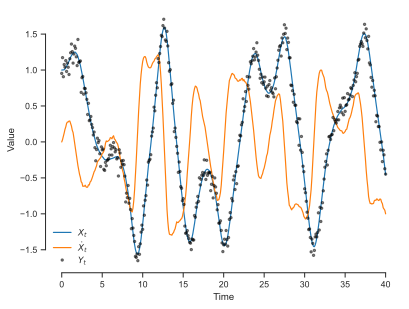

In [3]:
fig, ax = plt.subplots()
ax.plot(ts, xs[:, 0], label='$X_t$')
ax.plot(ts, xs[:, 1], label='$\dot{X}_t$')
ax.plot(ts, ys, 'k.', label='$Y_t$', alpha=0.5)
ax.legend(frameon=False)
ax.set_xlabel('Time')
ax.set_ylabel('Value')
sns.despine(trim=True)

In [9]:
from functools import partial 
from jax import jit, vmap
import jax
import equinox as eqx

DUFFING_DT = dt

class Duffing(eqx.Module):
    alpha: jax.Array
    beta: jax.Array
    gamma: jax.Array
    delta: jax.Array
    log_sigma_x: jax.Array
    log_sigma_v: jax.Array
    log_s: jax.Array
    mu_X: jax.Array
    log_sigma_X: jax.Array
    mu_dot_X: jax.Array
    log_sigma_dot_X: jax.Array

    def __init__(self, alpha=alpha, beta=beta, gamma=gamma, delta=delta, omega=omega, 
                 sigma_x=sigma_x, sigma_v=sigma_v, s=s, 
                 mu_X=1.0,
                 sigma_X=1.0,
                 mu_dot_X=0.0,
                 sigma_dot_X=0.1):
        self.alpha = jnp.array(alpha)
        self.beta = jnp.array(beta)
        self.gamma = jnp.array(gamma)
        self.delta = jnp.array(delta)
        self.log_sigma_x = jnp.log(sigma_x)
        self.log_sigma_v = jnp.log(sigma_v)
        self.log_s = jnp.log(s)
        self.mu_X = jnp.array(mu_X)
        self.log_sigma_X = jnp.log(sigma_X)
        self.mu_dot_X = jnp.array(mu_dot_X)
        self.log_sigma_dot_X = jnp.log(sigma_dot_X)


    def drift(self, x, u):
        return jnp.array([x[1], 
                          -self.alpha * x[0] - self.beta * x[0] ** 3 - self.delta * x[1] 
                          + self.gamma * u])

    def diffusion(self, x):
        return jnp.exp(jnp.array([self.log_sigma_x, self.log_sigma_v]))
    
    @eqx.filter_jit
    @partial(vmap, in_axes=(None, 0))
    def sample_init(self, key):
        key1, key2 = jr.split(key)
        sigma_X = jnp.exp(self.log_sigma_X)
        sigma_dot_X = jnp.exp(self.log_sigma_dot_X)
        X0 = jr.normal(key1) * jnp.exp(sigma_X) + self.mu_X
        dot_X0 = jr.normal(key2) * jnp.exp(sigma_dot_X) + self.mu_dot_X
        return jnp.array([X0, dot_X0])
    
    @partial(vmap, in_axes=(None, 0))
    def log_prob_init(self, x):
        return self._log_prob_init(x)
    
    def _log_prob_init(self, x):
        X0 = x[0]
        dot_X0 = x[1]
        sigma_X = jnp.exp(self.log_sigma_X)
        sigma_dot_X = jnp.exp(self.log_sigma_dot_X)
        log_prob_x = -0.5 * ((X0 - self.mu_X) / sigma_X) ** 2 - self.log_sigma_X
        log_prob_dot_x = -0.5 * ((dot_X0 - self.mu_dot_X) / sigma_dot_X) ** 2 - self.log_sigma_dot_X
        return log_prob_x + log_prob_dot_x
    
    @eqx.filter_jit
    @partial(vmap, in_axes=(None, 0, None, 0))
    def transition(self, x_prev, u, key):
        drift = self.drift(x_prev, u)
        diffusion = self.diffusion(x_prev)
        return x_prev + drift * DUFFING_DT + jnp.sqrt(DUFFING_DT) * diffusion * jr.normal(key, shape=x_prev.shape)
    
    def _log_prob_transition(self, x_next, u, x_prev):
        drift = self.drift(x_prev, u)
        diffusion = self.diffusion(x_prev)
        mean = x_prev + drift * DUFFING_DT
        L = jnp.sqrt(DUFFING_DT) * diffusion
        return -0.5 * jnp.sum(((x_next - mean) / L) ** 2) - jnp.sum(jnp.log(L))

    @eqx.filter_jit
    @partial(vmap, in_axes=(None, 0, None, 0))
    def log_prob_transition(self, x_next, u_prev, x_prev):
        return self._log_prob_transition(x_next, u_prev, x_prev)
    
    @eqx.filter_jit
    @partial(vmap, in_axes=(None, 0, None, None))
    @partial(vmap, in_axes=(None, None, None, 0))
    def pairwise_log_prob_transition(self, x_next, u, x_prev):
        return self._log_prob_transition(x_next, u, x_prev)

    @eqx.filter_jit
    @partial(vmap, in_axes=(None, None, 0))
    def log_prob_observation(self, y, x):
        return self._log_prob_observation(y, x)
    
    def _log_prob_observation(self, y, x):
        return -0.5 * ((y - x[0]) / jnp.exp(self.log_s)) ** 2 - self.log_s

In [12]:
model = Duffing()
model

Duffing(
  alpha=weak_f32[],
  beta=weak_f32[],
  gamma=weak_f32[],
  delta=weak_f32[],
  log_sigma_x=weak_f32[],
  log_sigma_v=weak_f32[],
  log_s=weak_f32[],
  mu_X=weak_f32[],
  log_sigma_X=weak_f32[],
  mu_dot_X=weak_f32[],
  log_sigma_dot_X=weak_f32[]
)

In [ ]:
model.log_sigma_x

Array(-4.6051702, dtype=float32, weak_type=True)

In [13]:
@eqx.filter_jit
def particle_filter(model, us, ys, key, num_particles=1000):
    def f(carry, uy):
        x_prev, log_w_prev, key = carry
        u, y = uy
        w_prev = jnp.exp(log_w_prev)
        key, subkey = jr.split(key)
        tilde_x_prev = jr.choice(subkey, x_prev, shape=(x_prev.shape[0],), p=w_prev)
        key, subkey = jr.split(key)
        keys = jr.split(subkey, x_prev.shape[0])
        x_next = model.transition(tilde_x_prev, u, keys)
        log_w_next = model.log_prob_observation(y, x_next)
        log_w_next = log_w_next - jax.scipy.special.logsumexp(log_w_next)
        return (x_next, log_w_next, key), (x_next, log_w_next)
    key, subkey = jr.split(key)
    keys = jr.split(subkey, num_particles)
    x0 = model.sample_init(keys)
    log_w0 = -jnp.log(num_particles) * jnp.ones(num_particles)
    init = (x0, log_w0, key)
    _, (xs, log_ws) = jax.lax.scan(f, init, (us, ys))
    xs = jnp.concatenate([x0[None, :, :], xs], axis=0)
    log_ws = jnp.concatenate([log_w0[None, :], log_ws], axis=0)
    return xs, log_ws

In [ ]:
us = jnp.cos(omega * ts)
particles, log_weights = particle_filter(model, us[:200], ys[:200], key, num_particles=100_000)

In [ ]:
particles.shape

(201, 100000, 2)

Make predictions after the end of the filter.

In [ ]:
@eqx.filter_jit
def predict(model, x0, log_w0, us_next, key):
    key, subkey = jr.split(key)
    w0 = jnp.exp(log_w0)
    tilde_x0 = jr.choice(subkey, x0, shape=(last_particles.shape[0],), p=w0)
    def f(carry, u):
        x_prev, key = carry
        key, subkey = jr.split(key)
        keys = jr.split(subkey, x_prev.shape[0])
        x_next = model.transition(x_prev, u, keys)
        return (x_next, key), x_next
    init = (tilde_x0, key)
    _, particles = jax.lax.scan(f, init, us_next)
    return particles

last_log_weights = log_weights[-1]
last_particles = particles[-1]
us_next = us[200:]
future_particles = predict(model, last_particles, last_log_weights, us_next, key)

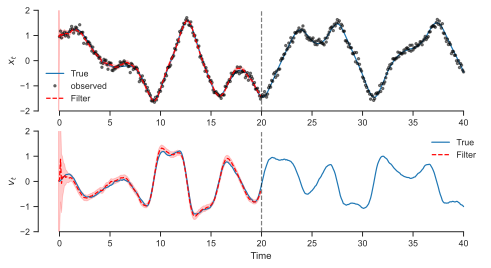

In [ ]:
weights = jnp.exp(log_weights)
mean = jnp.sum(particles * weights[:, :, None], axis=1)
var = jnp.sum(particles ** 2 * weights[:, :, None], axis=1) - mean ** 2
std = jnp.sqrt(var)
its = jnp.concatenate([jnp.array([t0 - DUFFING_DT]), ts[:200]])

fig, ax = plt.subplots(2, 1, figsize=(8, 4), dpi=300)
ax[0].plot(ts, xs[:, 0], label='True')
ax[1].plot(ts, xs[:, 1], label=r'True')
ax[0].plot(ts, ys, 'k.', label='observed', alpha=0.5)
ax[0].plot(its, mean[:, 0], label='Filter', linestyle='--', color='red')
ax[0].fill_between(its, mean[:, 0] - 2 * std[:, 0], mean[:, 0] + 2 * std[:, 0], alpha=0.2, color='red')
ax[1].plot(its, mean[:, 1], label=r'Filter', linestyle='--', color='red')
ax[1].fill_between(its, mean[:, 1] - 2 * std[:, 1], mean[:, 1] + 2 * std[:, 1], alpha=0.2, color='red')
# Vertical line at t = 20
for a in ax:
    a.axvline(ts[200], linestyle='--', color='black', alpha=0.5)
ax[0].legend(frameon=False)
ax[1].set_xlabel('Time')
ax[0].set_ylabel(r'$x_t$')
ax[1].set_ylabel(r'$v_t$')
ax[1].legend(frameon=False)
ax[0].set_ylim(-2, 2)
ax[1].set_ylim(-2, 2)
sns.despine(trim=True)
fig.savefig('duffing_befor.png')

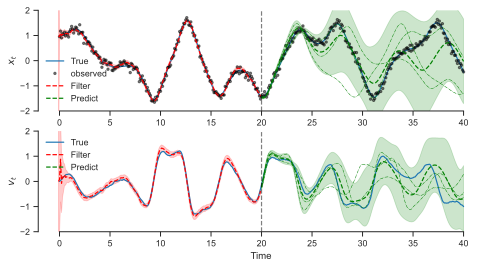

In [ ]:
weights = jnp.exp(log_weights)
mean = jnp.sum(particles * weights[:, :, None], axis=1)
var = jnp.sum(particles ** 2 * weights[:, :, None], axis=1) - mean ** 2
std = jnp.sqrt(var)

future_mean = jnp.mean(future_particles, axis=1)
future_var = jnp.var(future_particles, axis=1)
future_std = jnp.sqrt(future_var)

fig, ax = plt.subplots(2, 1, figsize=(8, 4), dpi=300)
ax[0].plot(ts, xs[:, 0], label='True')
ax[1].plot(ts, xs[:, 1], label=r'True')
ax[0].plot(ts, ys, 'k.', label='observed', alpha=0.5)
ax[0].plot(its, mean[:, 0], label='Filter', linestyle='--', color='red')
ax[0].fill_between(its, mean[:, 0] - 2 * std[:, 0], mean[:, 0] + 2 * std[:, 0], alpha=0.2, color='red')
ax[0].plot(ts[200:], future_mean[:, 0], label='Predict', linestyle='--', color='green')
ax[0].fill_between(ts[200:], future_mean[:, 0] - 2 * future_std[:, 0], future_mean[:, 0] + 2 * future_std[:, 0], alpha=0.2, color='green')
ax[1].plot(its, mean[:, 1], label=r'Filter', linestyle='--', color='red')
ax[1].fill_between(its, mean[:, 1] - 2 * std[:, 1], mean[:, 1] + 2 * std[:, 1], alpha=0.2, color='red')
ax[1].plot(ts[200:], future_mean[:, 1], label=r'Predict', linestyle='--', color='green')
ax[1].fill_between(ts[200:], future_mean[:, 1] - 2 * future_std[:, 1], future_mean[:, 1] + 2 * future_std[:, 1], alpha=0.2, color='green')
ax[0].plot(ts[200:], future_particles[:, 0:3, 0], '-.', color='green', lw=0.5)
ax[1].plot(ts[200:], future_particles[:, 0:3, 1], '-.', color='green', lw=0.5)
# Vertical line at t = 20
for a in ax:
    a.axvline(ts[200], linestyle='--', color='black', alpha=0.5)
ax[0].legend(frameon=False)
ax[1].set_xlabel('Time')
ax[0].set_ylabel(r'$x_t$')
ax[1].set_ylabel(r'$v_t$')
ax[1].legend(frameon=False)
ax[0].set_ylim(-2, 2)
ax[1].set_ylim(-2, 2)
sns.despine(trim=True)
fig.savefig('duffing.png')

/var/folders/3n/r5vj11ss7lzcdl10vfhb_mw00000gs/T/ipykernel_81013/2739613414.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, dpi=300)


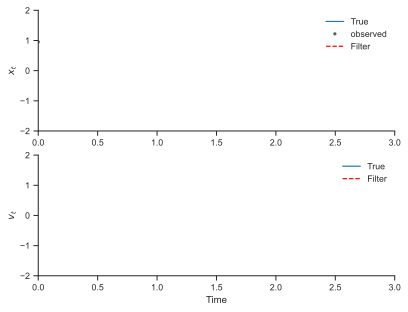

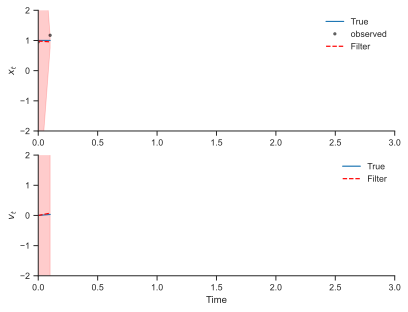

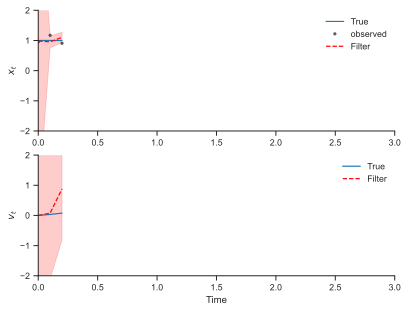

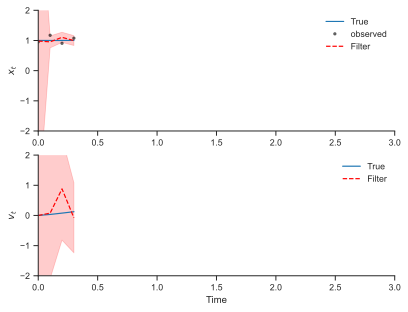

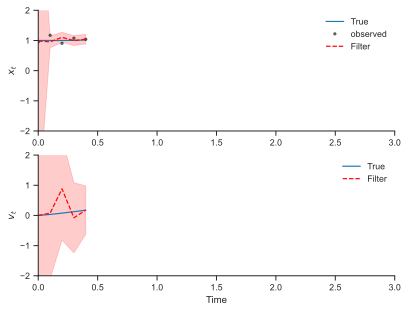

...

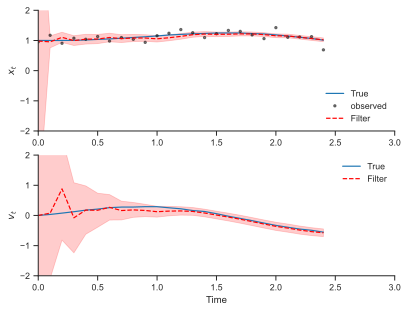

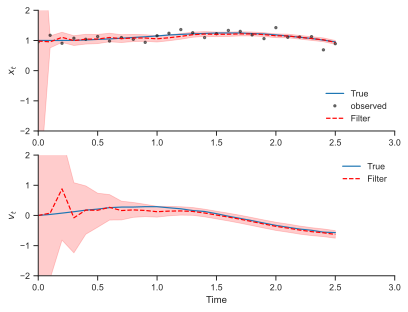

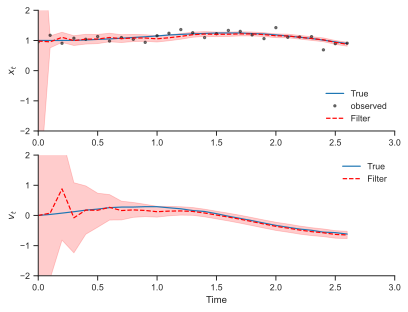

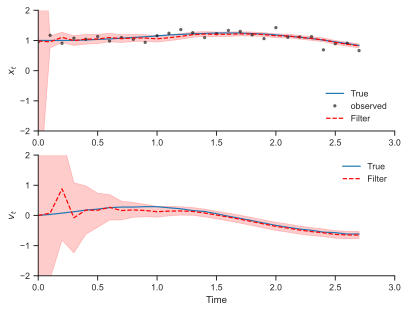

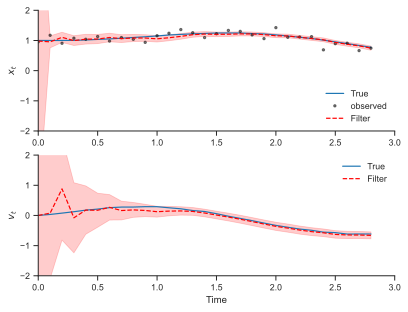

In [ ]:
# visualize the filter with uncertainty after each step of the filter
# make a different picture
for i in range(1, int(3/dt)):
    fig, ax = plt.subplots(2, 1, dpi=300)
    ax[0].plot(ts[:i], xs[:i, 0],  label='True')
    ax[1].plot(ts[:i], xs[:i, 1],  label='True')
    ax[0].plot(ts[:i], ys[:i], 'k.', label='observed', alpha=0.5)
    ax[0].plot(ts[:i], mean[:i, 0], label='Filter', linestyle='--', color='red')
    ax[0].fill_between(ts[:i], mean[:i, 0] - 2 * std[:i, 0], mean[:i, 0] + 2 * std[:i, 0], alpha=0.2, color='red')
    ax[1].plot(ts[:i], mean[:i, 1], label=r'Filter', linestyle='--', color='red')
    ax[1].fill_between(ts[:i], mean[:i, 1] - 2 * std[:i, 1], mean[:i, 1] + 2 * std[:i, 1], alpha=0.2, color='red')
    ax[0].set_ylim(-2, 2)
    ax[1].set_ylim(-2, 2)
    ax[0].set_xlim(0, 3)
    ax[1].set_xlim(0, 3)
    ax[0].legend(frameon=False)
    ax[1].set_xlabel('Time')
    ax[0].set_ylabel(r'$x_t$')
    ax[1].set_ylabel(r'$v_t$')
    ax[1].legend(frameon=False)
    sns.despine(trim=True)
    plt.savefig(f'duffing_{i}.png')

## Smoothing

In [16]:
@eqx.filter_jit
@partial(vmap, in_axes=(None, None, None, None, 0))
def particle_smoother_sampler(model, particles, log_weights, us, key):
    def f(carry, data_t):
        x_ts, log_w_ts, u = data_t
        x_tp1, key = carry
        log_trans_prob = model.pairwise_log_prob_transition(x_tp1[None, :], u, x_ts).flatten()
        log_v_ts = log_w_ts + log_trans_prob
        log_v_ts = log_v_ts - jax.scipy.special.logsumexp(log_v_ts)
        key, subkey = jr.split(key)
        v_ts = jnp.exp(log_v_ts)
        x_t = jr.choice(subkey, x_ts, p=v_ts)
        return (x_t, key), x_t
    x_Ts = particles[-1]
    log_w_Ts = log_weights[-1]
    w_Ts = jnp.exp(log_w_Ts)
    key, subkey = jr.split(key)
    x_T = jr.choice(subkey, x_Ts, p=w_Ts)
    init = (x_T, key)
    _, trajectory = jax.lax.scan(f, init, 
                                 (particles[-2::-1], log_weights[-2::-1], 
                                  us[-1::-1]))
    trajectory = jnp.concatenate([x_T[None, :], trajectory], axis=0)
    return trajectory[::-1]

In [17]:
keys = jr.split(key, 300)
trajectories = particle_smoother_sampler(model, particles, log_weights, us[:200], keys)

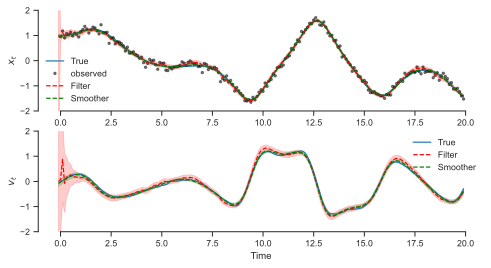

In [ ]:
smooth_p025, smooth_p50, smooth_p975 = jnp.percentile(trajectories, jnp.array([2.5, 50., 97.5]), axis=0)

fig, ax = plt.subplots(2, 1, figsize=(8, 4), dpi=300)
ax[0].plot(ts[:200], xs[:200, 0], label='True')
ax[1].plot(ts[:200], xs[:200, 1], label=r'True')
ax[0].plot(ts[:200], ys[:200], 'k.', label='observed', alpha=0.5)
ax[0].plot(its, mean[:, 0], label='Filter', linestyle='--', color='red')
ax[0].fill_between(its, mean[:, 0] - 2 * std[:, 0], mean[:, 0] + 2 * std[:, 0], alpha=0.2, color='red')
ax[1].plot(its, mean[:, 1], label=r'Filter', linestyle='--', color='red')
ax[1].fill_between(its, mean[:, 1] - 2 * std[:, 1], mean[:, 1] + 2 * std[:, 1], alpha=0.2, color='red')
ax[0].plot(its, smooth_p50[:, 0], label='Smoother', linestyle='--', color='green')
ax[0].fill_between(its, smooth_p025[:, 0], smooth_p975[:, 0], alpha=0.2, color='green')
ax[1].plot(its, smooth_p50[:, 1], label=r'Smoother', linestyle='--', color='green')
ax[1].fill_between(its, smooth_p025[:, 1], smooth_p975[:, 1], alpha=0.2, color='green')
ax[0].legend(frameon=False)
ax[1].set_xlabel('Time')
ax[0].set_ylabel(r'$x_t$')
ax[1].set_ylabel(r'$v_t$')
ax[1].legend(frameon=False)
ax[0].set_ylim(-2, 2)
ax[1].set_ylim(-2, 2)
sns.despine(trim=True)
fig.savefig('duffing_smooth.png')

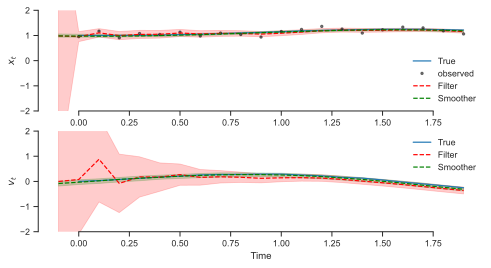

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(8, 4), dpi=300)
ax[0].plot(ts[:20], xs[:20, 0], label='True')
ax[1].plot(ts[:20], xs[:20, 1], label=r'True')
ax[0].plot(ts[:20], ys[:20], 'k.', label='observed', alpha=0.5)
ax[0].plot(its[:21], mean[:21, 0], label='Filter', linestyle='--', color='red')
ax[0].fill_between(its[:21], mean[:21, 0] - 2 * std[:21, 0], mean[:21, 0] + 2 * std[:21, 0], alpha=0.2, color='red')
ax[1].plot(its[:21], mean[:21, 1], label=r'Filter', linestyle='--', color='red')
ax[1].fill_between(its[:21], mean[:21, 1] - 2 * std[:21, 1], mean[:21, 1] + 2 * std[:21, 1], alpha=0.2, color='red')
ax[0].plot(its[:21], smooth_p50[:21, 0], label='Smoother', linestyle='--', color='green')
ax[0].fill_between(its[:21], smooth_p025[:21, 0], smooth_p975[:21, 0], alpha=0.2, color='green')
ax[1].plot(its[:21], smooth_p50[:21, 1], label=r'Smoother', linestyle='--', color='green')
ax[1].fill_between(its[:21], smooth_p025[:21, 1], smooth_p975[:21, 1], alpha=0.2, color='green')

ax[0].legend(frameon=False)
ax[1].set_xlabel('Time')
ax[0].set_ylabel(r'$x_t$')
ax[1].set_ylabel(r'$v_t$')
ax[1].legend(frameon=False)
ax[0].set_ylim(-2, 2)
ax[1].set_ylim(-2, 2)
sns.despine(trim=True)
fig.savefig('duffing_smooth_20.png')

## Expectation-Maximization

In [20]:
@eqx.filter_jit
@partial(vmap, in_axes=(None, 0, None, None))
def log_prob(model, xs, us, ys):
    log_prob_init = model._log_prob_init(xs[0])
    def f(carry, xuy):
        x_prev = carry
        x_next, u_prev, y_next = xuy
        log_prob_t = model._log_prob_transition(x_next, u_prev, x_prev)
        log_prob_o = model._log_prob_observation(y_next, x_next)
        return x_next, log_prob_t + log_prob_o
    init = xs[0]
    _, log_prob_ts = jax.lax.scan(f, init, (xs[1:], us, ys))
    return log_prob_init + jnp.sum(log_prob_ts, axis=0)

In [ ]:
trajectories[:, 1:].shape

(300, 200, 2)

In [ ]:
log_prob(model, trajectories, us[:200], ys[:200])

Array([2111.057 , 2121.517 , 2136.097 , 2139.9404, 2142.5762, 2135.7158,
       2132.8237, 2152.0698, 2154.0835, 2128.3755, 2131.955 , 1283.2355,
       2132.4446, 2117.7031, 2116.137 , 2125.9268, 2132.4624, 2123.2766,
       2126.653 , 2134.9104, 2125.619 , 2152.343 , 2147.2407, 2133.9736,
       2116.6338, 2144.6672, 2168.7324, 2144.8154, 2126.141 , 2115.5781,
       2138.6062, 2138.683 , 2121.6565, 2143.3418, 2130.8867, 2125.3635,
       2126.9214, 2141.9807, 2121.1653, 2117.9348, 2141.5642, 2126.114 ,
       2132.3123, 2131.2876, 2140.5786, 2142.6196, 2171.9143, 2134.9517,
       2155.206 , 2115.2349, 2134.258 , 2139.0273, 2135.0857, 2113.071 ,
       2125.727 , 2123.504 , 1317.1672, 2141.459 , 2147.5486, 2136.5713,
       2108.124 , 2119.8623, 2129.7607, 2149.643 , 2142.9673, 2156.27  ,
       2123.4832, 2140.6404, 2111.506 , 2120.8765, 2103.4136, 2139.4536,
       2129.2744, 2147.2107, 2137.99  , 2131.2222, 2137.3416, 2113.6082,
       2144.2734, 2138.8335, 2092.4016, 2107.9868, 

In [21]:
def expectation_maximization(model, us, ys, key, optimizer, num_particles=1000, num_trajectories=10, num_m_single_steps=10):
    def e_step(model, e_key):
        particles, log_weights = particle_filter(model, us, ys, e_key, num_particles=num_particles)
        return particles, log_weights
    
    def loss_fn(model, trajectories):
        return -jnp.mean(log_prob(model, trajectories, us, ys))
    
    @eqx.filter_jit
    def m_step_single(model, trajectories, opt_state):
        print(loss_fn(model, trajectories))
        quit()
        grads = jax.grad(loss_fn)(model, trajectories)
        updates, opt_state = optimizer.update(
            grads, opt_state, eqx.filter(model, eqx.is_array)
        )
        model = eqx.apply_updates(model, updates)
        return model, opt_state
    
    def m_step(model, particles, log_weights, opt_state, m_key):
        model_old = model
        for _ in range(num_m_single_steps):
            m_key, sub_m_key = jr.split(m_key)
            m_keys = jr.split(sub_m_key, num_trajectories)
            trajectories = particle_smoother_sampler(model_old, particles, log_weights, us, m_keys)
            model, opt_state = m_step_single(model, trajectories, opt_state)
        return model, opt_state
    
    opt_state = optimizer.init(eqx.filter(model, eqx.is_array))
    for i in range(10):
        key, e_key, m_key = jr.split(key, 3)
        particles, log_weights = e_step(model, e_key)
        model, opt_state = m_step(model, particles, log_weights, opt_state, m_key)
    return model

In [ ]:
from optax import adam

optimizer = adam(1e-3)
model = expectation_maximization(model, us[:200], ys[:200], key, optimizer)

Traced<ShapedArray(float32[])>with<DynamicJaxprTrace(level=1/0)>
Traced<ShapedArray(float32[])>with<DynamicJaxprTrace(level=1/0)>
Traced<ShapedArray(float32[])>with<DynamicJaxprTrace(level=1/0)>


: 

In [ ]:
out2.shape

(199, 200)